#Import Library

In [1]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import random
from collections import Counter
from google.colab import drive
from PIL import Image, UnidentifiedImageError, ExifTags

#Mount Drive

In [2]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Resize the Train Dataset (Online Source Dataset)

In [3]:
# Define source and target folder mappings
folders = {
    "/content/drive/MyDrive/TCV BANANA/Real Dataset/train/Unripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Final/Unripe",
    "/content/drive/MyDrive/TCV BANANA/Real Dataset/train/Semiripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Final/Semiripe",
    "/content/drive/MyDrive/TCV BANANA/Real Dataset/train/Ripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Final/Ripe",
    "/content/drive/MyDrive/TCV BANANA/Real Dataset/train/Overripe-Rotten": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Final/Overripe-Rotten",
}

# Create target folders if they don’t exist
for target_folder in folders.values():
    os.makedirs(target_folder, exist_ok=True)

# Process each category
for source_folder, target_folder in folders.items():
    image_files = sorted(
        [f for f in os.listdir(source_folder) if f.lower().endswith(('png', 'jpg', 'jpeg'))]
    )

    if not image_files:
        print(f"No images found in {source_folder}. Skipping...")
        continue

    for image_file in image_files:
        try:
            image_path = os.path.join(source_folder, image_file)

            try:
                image = Image.open(image_path)
            except UnidentifiedImageError:
                print(f"Error: Unable to open '{image_file}'. Skipping...")
                continue

            # Handle EXIF orientation
            try:
                for orientation in ExifTags.TAGS.keys():
                    if ExifTags.TAGS[orientation] == 'Orientation':
                        break
                exif = dict(image._getexif().items())
                if exif.get(orientation) == 3:
                    image = image.rotate(180, expand=True)
                elif exif.get(orientation) == 6:
                    image = image.rotate(270, expand=True)
                elif exif.get(orientation) == 8:
                    image = image.rotate(90, expand=True)
            except (AttributeError, KeyError, IndexError):
                pass

            # Resize image while maintaining aspect ratio
            image.thumbnail((224, 224), Image.Resampling.LANCZOS)

            # Create a white background canvas
            new_image = Image.new("RGB", (224, 224), (255, 255, 255))

            # Paste centered image
            paste_x = (224 - image.size[0]) // 2
            paste_y = (224 - image.size[1]) // 2
            new_image.paste(image, (paste_x, paste_y))

            # Define output filename (same as source image name)
            output_path = os.path.join(target_folder, image_file)
            new_image.save(output_path)

            print(f"Saved: {image_file}")
        except Exception as e:
            print(f"Error processing '{image_file}': {e}")

print("Resizing and padding completed!")

Saved: Unripe_001.jpg
Saved: Unripe_002.jpg
Saved: Unripe_003.jpg
Saved: Unripe_004.jpg
Saved: Unripe_005.jpg
Saved: Unripe_006.jpg
Saved: Unripe_007.jpg
Saved: Unripe_008.jpg
Saved: Unripe_009.jpg
Saved: Unripe_010.jpg
Saved: Unripe_011.jpg
Saved: Unripe_012.jpg
Saved: Unripe_013.jpg
Saved: Unripe_014.jpg
Saved: Unripe_015.jpg
Saved: Unripe_016.jpg
Saved: Unripe_017.jpg
Saved: Unripe_018.jpg
Saved: Unripe_019.jpg
Saved: Unripe_020.jpg
Saved: Unripe_021.jpg
Saved: Unripe_022.jpg
Saved: Unripe_023.jpg
Saved: Unripe_024.jpg
Saved: Unripe_025.jpg
Saved: Unripe_026.jpg
Saved: Unripe_027.jpg
Saved: Unripe_028.jpg
Saved: Unripe_029.jpg
Saved: Unripe_030.jpg
Saved: Unripe_031.jpg
Saved: Unripe_032.jpg
Saved: Unripe_033.jpg
Saved: Unripe_034.jpg
Saved: Unripe_035.jpg
Saved: Unripe_036.jpg
Saved: Unripe_037.jpg
Saved: Unripe_038.jpg
Saved: Unripe_039.jpg
Saved: Unripe_040.png
Saved: Unripe_041.png
Saved: Unripe_042.png
Saved: Unripe_044.png
Saved: Unripe_045.png
Saved: Unripe_046.png
Saved: Unr

#Visualation of the Dataset

##File Directories of the Resized Images

In [4]:
# Data directories
image_dirs = {
    "Unripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Final/Unripe",
    "Semiripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Final/Semiripe",
    "Ripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Final/Ripe",
    "Overripe-Rotten": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Final/Overripe-Rotten"
}

##Count the Images and Images Shapes

In [5]:
# Count images in each folder and calculate proportions
total_images = 0
image_counts = {}
for label, directory in image_dirs.items():
    image_counts[label] = len([f for f in os.listdir(directory) ])
    total_images += image_counts[label]

# Print the number of images per category and their proportions
print("Image Counts:")
for label, count in image_counts.items():
    proportion = (count / total_images) * 100 if total_images > 0 else 0
    print(f"{label}: {count} images ({proportion:.2f}%)")

Image Counts:
Unripe: 350 images (25.00%)
Semiripe: 350 images (25.00%)
Ripe: 350 images (25.00%)
Overripe-Rotten: 350 images (25.00%)


In [6]:
# Count image shapes
c= Counter([cv2.imread(os.path.join(directory, f)).shape for label, directory in image_dirs.items() for f in os.listdir(directory)])
print("Image Shape Counts:")
print(c)

Image Shape Counts:
Counter({(224, 224, 3): 1400})


##Display the 100 Images from each stage (Unripe, Ripe, Semiripe and Overripe-Rotten)

In [7]:
# Function to display images
def display_images(images, titles, main_title):
    num_images = len(images)
    cols = min(10, num_images)
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    axes = np.array(axes).reshape(-1)

    for ax, img, title in zip(axes, images, titles):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(title, fontsize=8)
        ax.axis('off')

    for ax in axes[len(images):]:
        ax.axis('off')

    fig.suptitle(main_title)
    plt.tight_layout()
    plt.show()

In [ ]:
# Load and display images from each folder
for label, directory in image_dirs.items():
    original_images = []
    titles = []
    print(f"Displaying images from folder {label}")
    count = 0

    image_list = [f for f in os.listdir(directory)]

    random.shuffle(image_list)

    selected_images = image_list[:100]

    for filename in selected_images:
        image_path = os.path.join(directory, filename)
        original_color = cv2.imread(image_path)
        if original_color is not None:
            original_images.append(original_color)
            titles.append(filename)

    if original_images:
        display_images(original_images, titles, f"Randomly Selected Images from {label} (Max 100)")
    else:
        print(f"No valid images found in {label}.")

In [9]:
def process_original_images(image_dirs):
    original_images = {}
    for label, directory in image_dirs.items():
        print(f"Storing Original Images: {label}")
        image_list = [f for f in os.listdir(directory) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.JPG'))]
        random.shuffle(image_list)

        all_originals, all_titles = [], []
        for filename in image_list:
            image_path = os.path.join(directory, filename)
            original = cv2.imread(image_path)
            if original is not None:
                all_originals.append(original)
                all_titles.append(filename)
        original_images[label] = {"original": all_originals, "titles": all_titles}
    return original_images

original_images_data = process_original_images(image_dirs)

Storing Original Images: Unripe
Storing Original Images: Semiripe
Storing Original Images: Ripe
Storing Original Images: Overripe-Rotten


#Preprocessing Stage

##Normalize Brightness of the Images

In [10]:
# Function: Normalize Brightness
def normalize_brightness(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8,8))
    l = clahe.apply(l)
    lab = cv2.merge((l, a, b))
    return cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

In [11]:
# Process and Store Normalized Images
def process_normalization(original_images):
    normalized_images = {}
    for label, data in original_images.items():
        print(f"Processing Brightness Normalization: {label}")
        all_normalized = {filename: normalize_brightness(img) for filename, img in zip(data["titles"], data["original"])}
        normalized_images[label] = {"original": data["original"], "normalized": all_normalized, "titles": data["titles"]}
    return normalized_images

normalized_images_data = process_normalization(original_images_data)

Processing Brightness Normalization: Unripe
Processing Brightness Normalization: Semiripe
Processing Brightness Normalization: Ripe
Processing Brightness Normalization: Overripe-Rotten


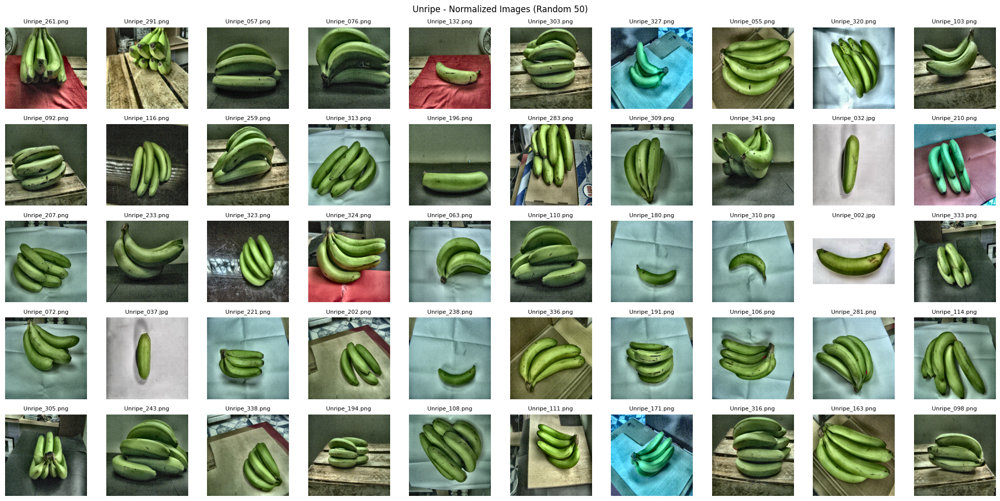

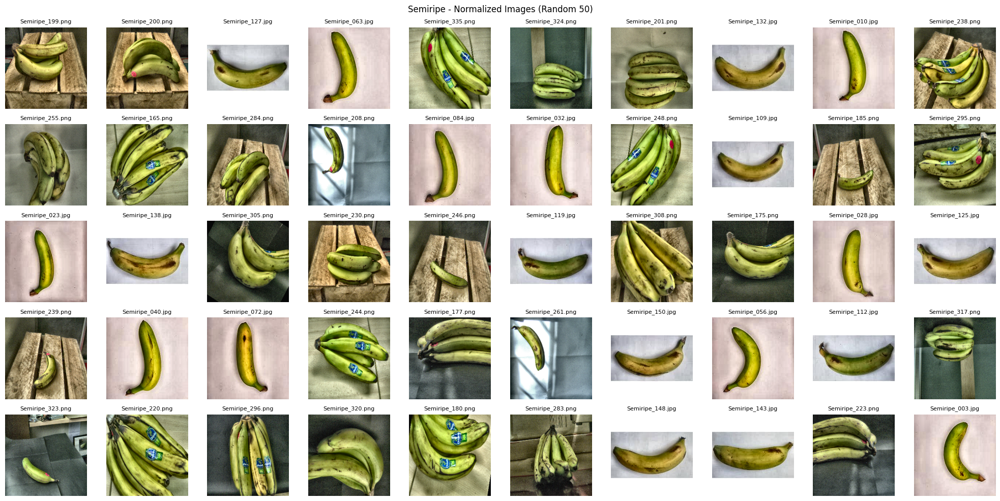

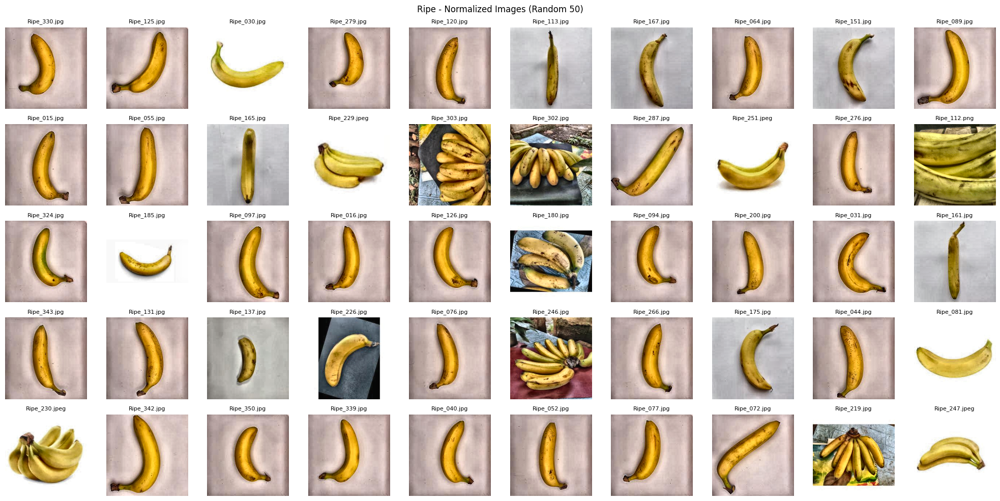

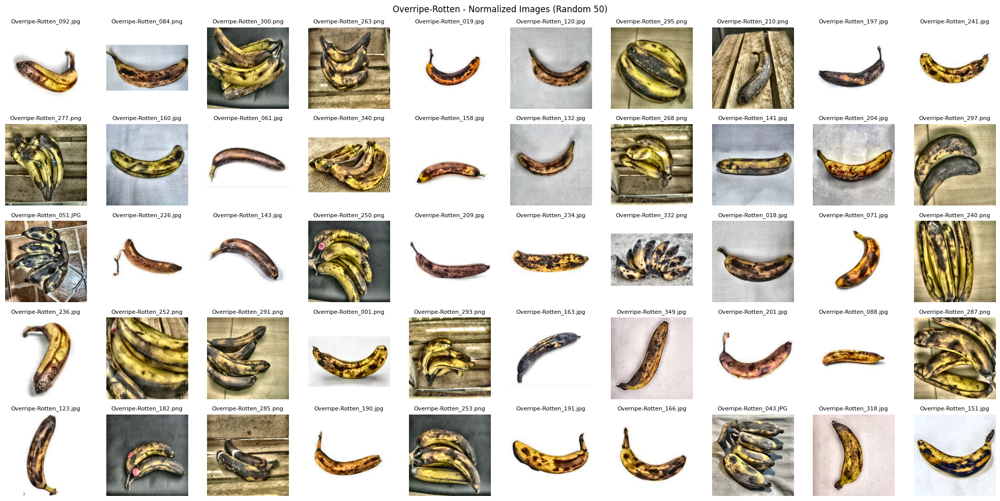

In [12]:
def display_normalized_images(normalized_images):
    for label, data in normalized_images.items():
        images = list(data["normalized"].values())
        titles = list(data["normalized"].keys())

        if not images:
            print(f"No valid images found in {label}.")
            continue

        num_samples = min(50, len(images))
        indices = random.sample(range(len(images)), num_samples)

        selected_images = [images[i] for i in indices]
        selected_titles = [titles[i] for i in indices]

        display_images(selected_images, selected_titles, f"{label} - Normalized Images (Random {num_samples})")

display_normalized_images(normalized_images_data)

##GrabCut Segmentation

In [13]:
# Function: GrabCut Segmentation
def grabcut_segmentation(img):
    height, width = img.shape[:2]

    # Define bounding rectangle with 5% margin
    margin_x, margin_y = int(width * 0.05), int(height * 0.05)
    rect = (margin_x, margin_y, width - 2 * margin_x, height - 2 * margin_y)

    # Create mask & background/foreground models
    mask = np.zeros(img.shape[:2], np.uint8)
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    # Initial GrabCut segmentation
    cv2.grabCut(img, mask, rect, bgd_model, fgd_model, 10, cv2.GC_INIT_WITH_RECT)

    # Convert weakly classified foreground pixels into definite foreground
    mask = np.where((mask == 2) | (mask == 0), 0, 1).astype("uint8")

    # Refine using morphology to reduce blurriness
    kernel = np.ones((5, 5), np.uint8)
    refined_mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)  # Closes gaps
    refined_mask = cv2.morphologyEx(refined_mask, cv2.MORPH_OPEN, kernel)  # Removes noise

    # Apply refined mask
    result = img * refined_mask[:, :, np.newaxis]

    return result

In [14]:
# Process and Store GrabCut Segmented Images
def process_grabcut(normalized_images):
    grabcut_images = {}
    for label, data in normalized_images.items():
        print(f"Processing GrabCut Segmentation: {label}")
        all_grabcut = {filename: grabcut_segmentation(img) for filename, img in data["normalized"].items()}
        grabcut_images[label] = {"original": data["original"], "grabcut": all_grabcut, "titles": data["titles"]}
    return grabcut_images

grabcut_images_data = process_grabcut(normalized_images_data)

Processing GrabCut Segmentation: Unripe
Processing GrabCut Segmentation: Semiripe
Processing GrabCut Segmentation: Ripe
Processing GrabCut Segmentation: Overripe-Rotten


In [ ]:
# Show GrabCut Segmented Images
def display_grabcut_images(grabcut_images):
    for label, data in grabcut_images.items():
        images = list(data["grabcut"].values())
        titles = list(data["grabcut"].keys())

        if not images:
            print(f"No valid images found in {label}.")
            continue

        num_samples = min(50, len(images))
        indices = random.sample(range(len(images)), num_samples)

        selected_images = [images[i] for i in indices]
        selected_titles = [titles[i] for i in indices]

        display_images(selected_images, selected_titles, f"{label} - GrabCut Segmented Images (Random {num_samples})")

display_grabcut_images(grabcut_images_data)

#Visualization of the Original and Preprocessing Images

In [ ]:
# Displays all images across processing stages (Original, Normalized, GrabCut)
def display_all_processed_images(original_images, normalized_images, grabcut_images, max_images=50):
    for label in original_images.keys():
        print(f"Displaying all images for category: {label}")

        original_images_list = list(original_images[label]["original"])
        normalized_images_list = list(normalized_images[label]["normalized"].values())
        grabcut_images_list = list(grabcut_images[label]["grabcut"].values())
        titles = list(original_images[label]["titles"])

        num_images = min(len(original_images_list), len(normalized_images_list), len(grabcut_images_list), max_images)
        if num_images == 0:
            print(f"No images found for {label}. Skipping...")
            continue

        cols = 3
        rows = num_images
        fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 5))
        axes = np.array(axes).reshape(rows, cols)

        for i in range(num_images):
            axes[i, 0].imshow(cv2.cvtColor(original_images_list[i], cv2.COLOR_BGR2RGB))
            axes[i, 0].set_title(f"{titles[i]} - Original")
            axes[i, 0].axis("off")

            axes[i, 1].imshow(cv2.cvtColor(normalized_images_list[i], cv2.COLOR_BGR2RGB))
            axes[i, 1].set_title("Brightness Normalized")
            axes[i, 1].axis("off")

            axes[i, 2].imshow(cv2.cvtColor(grabcut_images_list[i], cv2.COLOR_BGR2RGB))
            axes[i, 2].set_title("GrabCut Segmented")
            axes[i, 2].axis("off")

        plt.suptitle(f"Processing Steps for {label} (Max {max_images} Images)", fontsize=14)
        plt.tight_layout()
        plt.show()

display_all_processed_images(original_images_data, normalized_images_data, grabcut_images_data, max_images=50)


#Save the Preprocessed Images

In [22]:
# Save Preprocessed Images
save_dirs = {
    "Unripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/Unripe",
    "Semiripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/Semiripe",
    "Ripe": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/Ripe",
    "Overripe-Rotten": "/content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/Overripe-Rotten"
}

for label, path in save_dirs.items():
    os.makedirs(path, exist_ok=True)

def save_grabcut_images(grabcut_images_data):
    for label, data in grabcut_images_data.items():
        save_path = save_dirs[label]

        for filename, img in data["grabcut"].items():
            save_image_path = os.path.join(save_path, filename)
            cv2.imwrite(save_image_path, img)

        print(f" Saved {len(data['grabcut'])} grabcut images to {save_path}")

save_grabcut_images(grabcut_images_data)

 Saved 350 grabcut images to /content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/Unripe
 Saved 350 grabcut images to /content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/Semiripe
 Saved 350 grabcut images to /content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/Ripe
 Saved 350 grabcut images to /content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/Overripe-Rotten


# Processing own dataset

In [35]:
# Define new input and output directories
new_data_dir = "/content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Own"
new_save_dir = "/content/drive/MyDrive/TCV BANANA/Real Dataset/Preprocessed/Experiment_2/OwnDataset"
os.makedirs(new_save_dir, exist_ok=True)

# Process all images in the new dataset
for category in ["Ripe", "Semiripe", "Unripe", "Overripe-Rotten"]:
    folder_path = os.path.join(new_data_dir, category)
    if not os.path.exists(folder_path):
        print(f"Directory not found: {folder_path}")
        continue

    image_files = os.listdir(folder_path)
    print(f"Processing {len(image_files)} images in {category}")

    # Create output directory for this class
    category_save_dir = os.path.join(new_save_dir, category)
    os.makedirs(category_save_dir, exist_ok=True)

    for image_name in image_files:
        image_path = os.path.join(folder_path, image_name)
        original = cv2.imread(image_path)
        if original is None:
            print(f"Skipping {image_name}: Unable to read image.")
            continue

        # Step 1: Resize image to 224x224 before preprocessing
        resized_image = cv2.resize(original, (224, 224), interpolation=cv2.INTER_AREA)

        # Step 2: Normalize brightness
        normalized_image = normalize_brightness(resized_image)

        # Step 3: Perform GrabCut segmentation
        grabcut_image = grabcut_segmentation(normalized_image)

        # Save processed image
        save_image_path = os.path.join(category_save_dir, image_name)
        cv2.imwrite(save_image_path, grabcut_image)

    print(f"Completed processing and saving extracted bananas for {category}\n")


Processing 70 images in Ripe
Completed processing and saving extracted bananas for Ripe

Processing 70 images in Semiripe
Completed processing and saving extracted bananas for Semiripe

Processing 70 images in Unripe
Completed processing and saving extracted bananas for Unripe

Processing 70 images in Overripe-Rotten
Completed processing and saving extracted bananas for Overripe-Rotten



##Show Processed Images

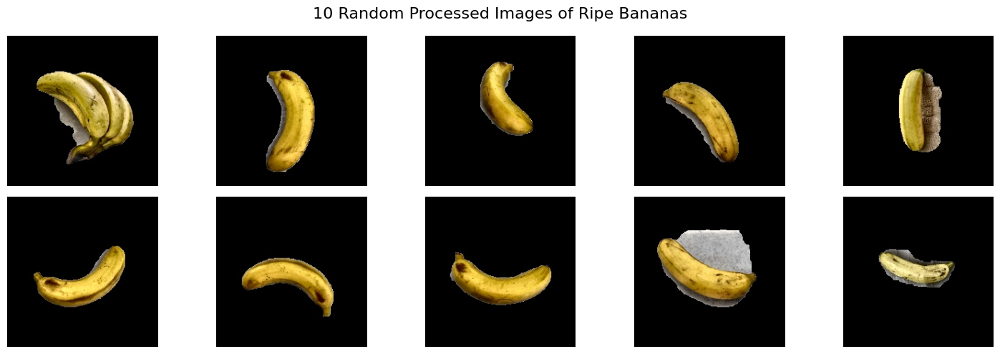

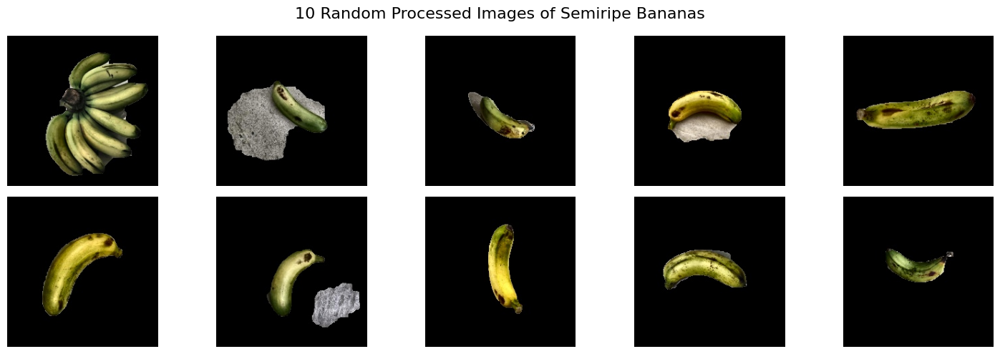

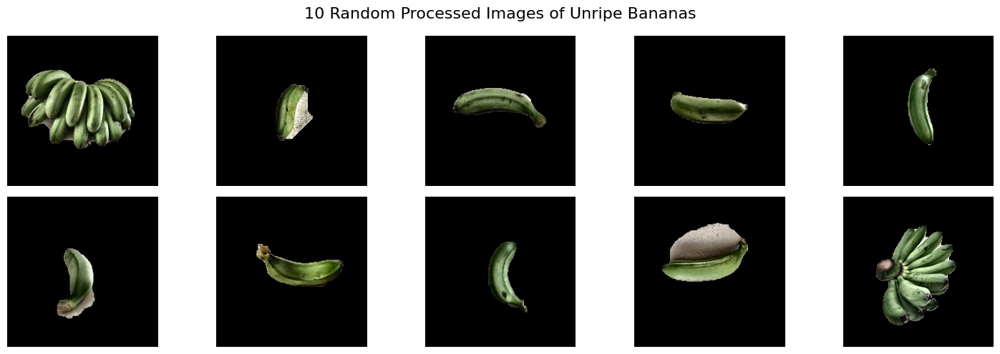

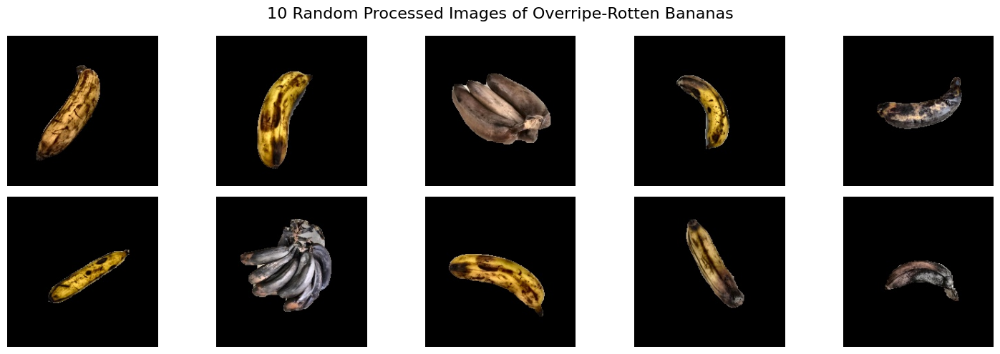

In [36]:
for category in ["Ripe", "Semiripe", "Unripe", "Overripe-Rotten"]:
    category_save_dir = os.path.join(new_save_dir, category)
    if not os.path.exists(category_save_dir):
        print(f"Skipping visualization: {category} folder not found in Experiment_1 > Own")
        continue

    saved_images = os.listdir(category_save_dir)

    if len(saved_images) == 0:
        print(f"No saved images found for {category}")
        continue

    # Select 10 random images for visualization
    sample_images = random.sample(saved_images, min(10, len(saved_images)))

    plt.figure(figsize=(15, 5))
    plt.suptitle(f"10 Random Processed Images of {category} Bananas", fontsize=16)

    for i, image_name in enumerate(sample_images):
        image_path = os.path.join(category_save_dir, image_name)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert for visualization

        plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns grid
        plt.imshow(img)
        plt.axis('off')

    plt.tight_layout()
    plt.show()